<h1 align="center"><strong>Ejercicio 03 - Transformada de Fourier en 1D y 2D</strong></h1>

- Autor: [Renzo Guerrero Huayta](https://github.com/renzoguerrero17)
- Problemas extraídos del curso Fundamentos del procesamiento de imágenes de la Universidad Católica de Chile.

# 1.Problema 01

## 1.1.Enunciado

Estimar la periodicidad en el numero de personas contagiadas diarimente con COVID en Chile en las ultimas 9 semanas. En este archivo de texto se encuentra tabulado el numero de personas contagiadas diariamiente con COVID en Chile. La tabla contiene un vector con 198 numeros, un numero por dia, el primer numero corresponde al numero de personas contagiadas el 04/03/20 y el ultimo numero corresponde al numero de personas contagiadas el 30/09/20. Al graficar todos los datos observamos una peridiocidad evidente en las ultimas semanas (el eje x corresponde a los dias, el eje y corresponde al numero de contagiados por dia). En este ejercicio se pretende estimar el numero de dias de este periodo. Para esto: 

1) Tome solo las ultimas 9 semanas (7x9 = 63 ultimos datos) y almacene sus datos en un vector 'y' de 63 elementos. 

2) Calcule un vector 'f' de 63 elementos que corresponde a 'y' sin su media, es decir la media de 'f' es cero. 

3) Calcule la transformada discreta de Fourier de 'f' y almacenela en la variable 'F'. 

4) Grafique el modulo de F en escala logaritmica usando 'log(abs(F)+1)' usando abs(F) y observe donde esta el maximo y que significa este maximo 

Ojo: el eje x de la Transformada de Fourier es la frecuencia, no el periodo de la señal. 

5) Estime a partir de este maximo en la transformada de Fourier el periodo de la senal 'y' en dias.

Solo para mentes curiosas: Los datos de Chile fueron extraidos de aqui... por si quieres ver como estan otros paises solo hay que bajar la planilla excel.

## 1.2.Solución

In [1]:
import numpy as np
from numpy.fft import fft2, fftshift, ifft2
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
import scipy as sp
import os
import plotly.graph_objects as go
from operator import itemgetter
from heapq import nlargest
np.set_printoptions(suppress = True)

In [100]:
!jt -r

Reset css and font defaults in:
C:\Users\titos\.jupyter\custom &
C:\Users\titos\AppData\Roaming\jupyter\nbextensions


In [3]:
os.chdir(r"C:\Users\titos\Github\Procesamiento Imagenes\Cap 04_Sistemas Lineales\ejercicios\imagenes")

In [174]:
data = pd.read_csv('covid_chile.txt',header = None)
data.columns = ['contagiados']
print(data.head(10))
print("Numero de registros:",data.shape[0])

   contagiados
0           50
1           14
2            6
3           73
4           61
5           72
6           64
7           83
8          145
9          189
Numero de registros: 198


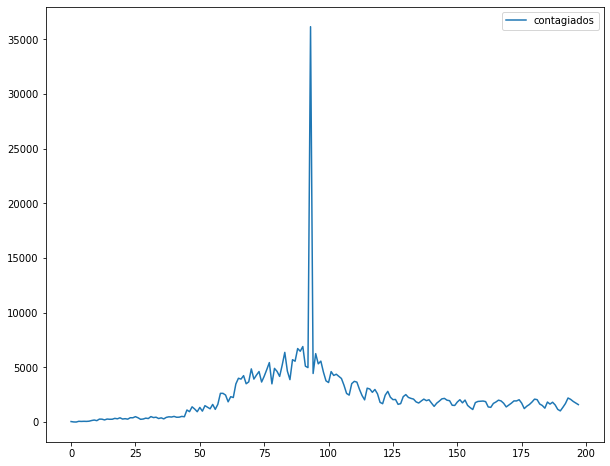

In [175]:
plot = data.plot(figsize=(10, 8))

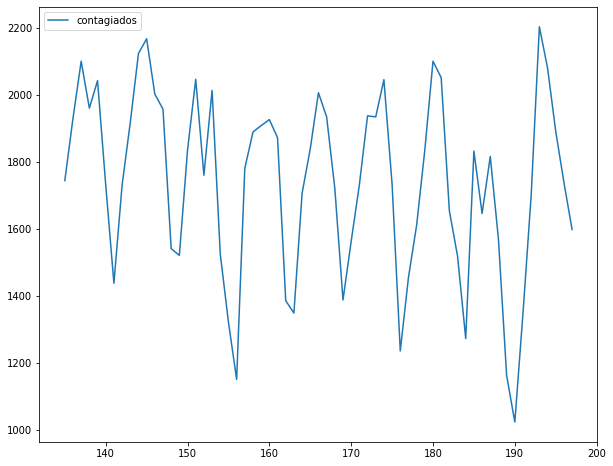

In [181]:
### Parte 1 ###
num_dias = 63
y = data.tail(num_dias)
plot_y = y.plot(figsize=(10, 8))
y = y['contagiados'].values

In [184]:
### Parte 2 ###
mean = y.mean()
print("Media del vector",mean)
y = np.array(y, dtype = np.float64)
f  = y- mean
print("Media del vector normalizado:",round(f.mean()))

Media del vector 1738.8412698412699
Media del vector normalizado: 0


In [185]:
### Parte 3 ###
F = np.fft.fft(f)

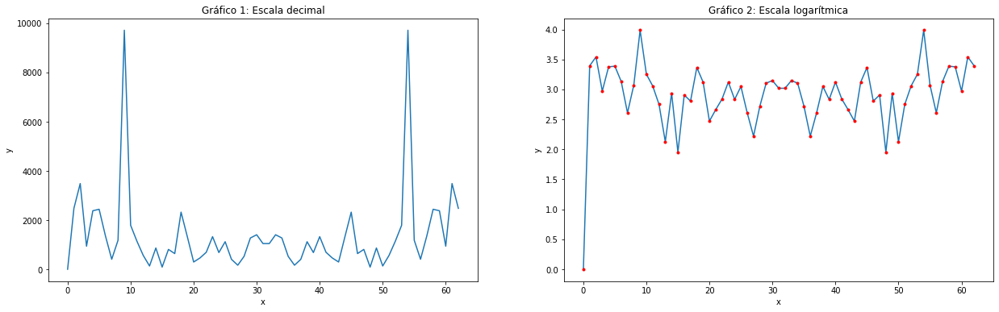

El máximo de la función se da en el elemento: 9


In [186]:
### Parte 4 ###
P = np.abs(F) # Módulo de Tranformada de Fourier
TF =  np.log10(P+1) # Escala logarítmica --> Real
x = np.arange(0,63)

plt.figure(1,figsize=(21,6))

plt.subplot(1, 2, 1)
plt.title('Gráfico 1: Escala decimal')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(x,P)


plt.subplot(1, 2, 2)
plt.title('Gráfico 2: Escala logarítmica')
plt.plot(x,TF)
plt.xlabel('x')
plt.ylabel('y')
plt.plot(x,TF,'r.')

plt.show()

print("El máximo de la función se da en el elemento:",P.argmax())

- Cómo se ve en el gráfico 1 la Transformada de Fourier (T.F) es simétrica con respecto al eje Y, además por definición la T.F es una función periódica , lo cual indica que esta forma se repitirá cada 63 días.

- Además el primer elemento de la T.F equivale a la frecuencia cero (es constante), en el gráfico 1 el primer elemento de la T.F me da 0 por que la media de la función "f" es 0.

- El máximo elemento de la T.F se da en la frecuencia 9, lo que indica es que en el total de datos analizados hay una sinusoide que sube y baja 9 veces en el período de tiempo analizado.

In [197]:
### Parte 5
# El periodo de la función será el número de días en la que se tiene la sinusoide entre las 
# veces que aparece esta en este periódo de tiempo
periodo = (num_dias) // (P.argmax())
print(f"El periodo de la función en {num_dias} días es de {periodo} días")

El periodo de la función en 63 días es de 7 días


# 2.Problema 02

## 2.1.Enunciado

Las siguientes imagenes son de 256x256 pixeles. I1 tiene una sinuoside vertical de 16 periodos. I2 tiene usa sinusoide horizontal de 8 periodos. I3 es el promedio de I1 e I2. Calcule la Transformada de Fourier en 2D de cada una de las imagenes y grafique su modulo, si no ve nada, intente mostrar solo los 32x32 pixeles de la esquina superior izquierda de la Transformada de Fourier. El modulo de la transformada de Fourier puede ser graficada como una imagen, o bien como una superficie en 3D (para esto ultimo puede usar el comando mesh en Matlab, o el la libreria plotly en Python). 

Describa en palabras cada una de las 3 graficas y explique por que la transformadas son asi. Las explicaciones incluyalas como comentarios en el codigo.

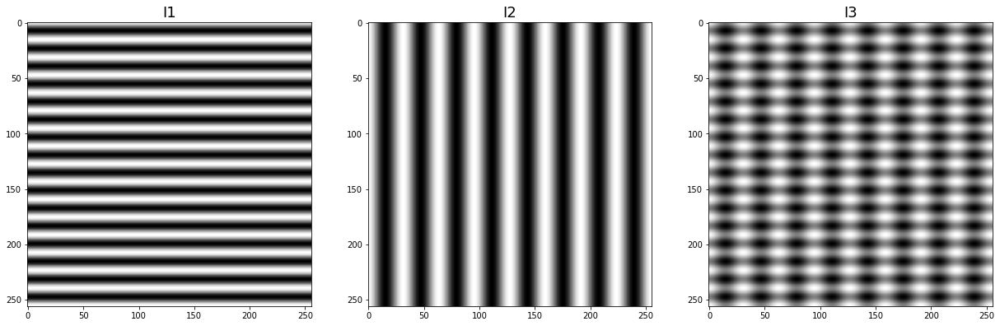

In [4]:
I1 = mpimg.imread('I1.png')
I2 = mpimg.imread('I2.png')
I3 = mpimg.imread('I3.png')

plt.figure(1,figsize=(21,9))

plt.subplot(1, 3, 1)
plt.title('I1',fontsize = 18)
plt.imshow(I1,cmap='gray')


plt.subplot(1, 3, 2)
plt.title('I2',fontsize = 18)
plt.imshow(I2,cmap = 'gray')


plt.subplot(1, 3, 3)
plt.title('I3',fontsize = 18)
plt.imshow(I3,cmap = 'gray')


plt.show()

## 2.2.Solución

### Imagen I1

In [5]:
H,W = 256,256

In [6]:
def graficar(path):
    imagen = mpimg.imread(path)
    name = path[0:2]
    name_r = str(name) + str(32) + str('x')+ str(32)
    recorte = imagen[0:32,0:32]
    
    H,W = np.shape(imagen)   # Dimensiones de la imagen I1
    H_r,W_r = np.shape(recorte)

    # Transformada de Fourier
    F = np.fft.fft2(imagen)/(W*H) # Normalizamos
    Fr = np.fft.fft2(recorte)/(W_r*H_r) # Normalizamos
    
    mod_F = np.abs(F) # Modulo
    mod_Fr = np.abs(Fr)


    # FFT Shift--> Desplaza cuadrantes
    FFT_shift = np.fft.fftshift(F)
    FFT_shift_r = np.fft.fftshift(Fr)
    
    mod_FFTshift = np.abs(FFT_shift) # Modulo
    mod_FFTshift_r = np.abs(FFT_shift_r)


    # Escala logaritmica
    esc_log = np.log10(mod_FFTshift + 1) # Modulo
    esc_log_r = np.log10(mod_FFTshift_r + 1)


    # Graficamos

    plt.figure(1,figsize=(16,12))

    plt.subplot(2, 4, 1)
    plt.title(name,fontsize = 18)
    plt.imshow(imagen,cmap='gray')

    plt.subplot(2, 4, 2)
    plt.title('Transformada Fourier',fontsize = 18)
    plt.imshow(mod_F,cmap = 'gray')

    plt.subplot(2, 4, 3)
    plt.title('FFT Shift',fontsize = 18)
    plt.imshow(mod_FFTshift,cmap = 'gray')

    plt.subplot(2, 4, 4)
    plt.title('Escala logaritmica',fontsize = 18)
    plt.imshow(esc_log,cmap = 'gray')
    
    plt.subplot(2, 4, 5)
    plt.title(name_r,fontsize = 18)
    plt.imshow(recorte,cmap='gray')
    
    plt.subplot(2, 4, 6)
    plt.title('Transformada Fourier',fontsize = 18)
    plt.imshow(mod_Fr,cmap = 'gray')
    
    plt.subplot(2, 4, 7)
    plt.title('FFT Shift',fontsize = 18)
    plt.imshow(mod_FFTshift_r,cmap = 'gray')
    
    plt.subplot(2, 4, 8)
    plt.title('Escala logaritmica',fontsize = 18)
    plt.imshow(esc_log_r,cmap = 'gray')
    
    return esc_log

In [7]:
def ptos(H_r,arrg):
    pts_p = [] # Lista de puntos con las coordenadas del pixel en la imagen y su valor en Fourier
    for i in range(0,H_r):
        for j in range(0,H_r):
            pts_p.append([j,i,arrg[j][i]])
    pts_p = np.array(pts_p)
    yp, xp, zp = pts_p.T
    return yp,xp,zp

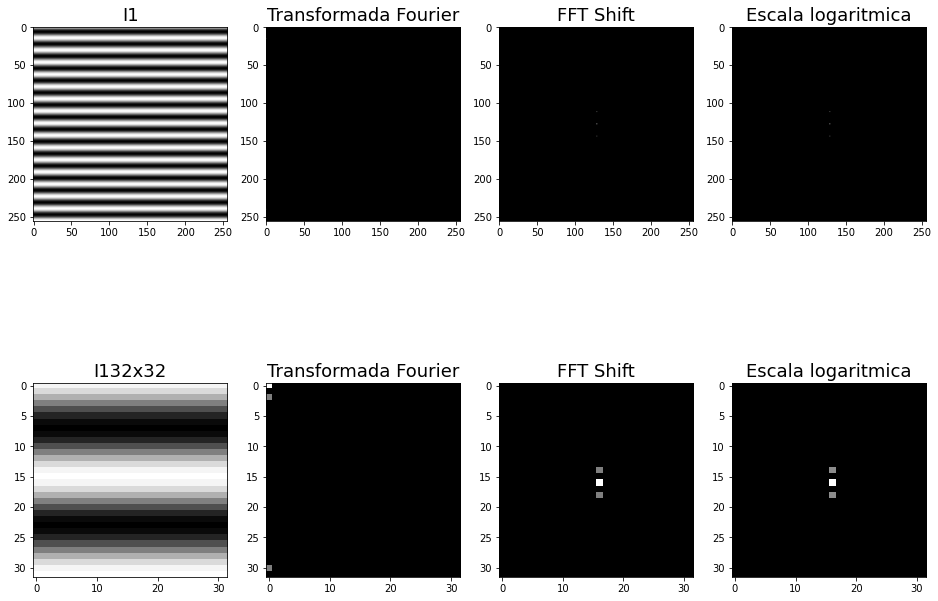

In [8]:
i1 = graficar('I1.png')

In [9]:
y1,x1,z1 = ptos(256,i1)

In [13]:
ptos(256,i1)

(array([  0.,   1.,   2., ..., 253., 254., 255.]),
 array([  0.,   0.,   0., ..., 255., 255., 255.]),
 array([0., 0., 0., ..., 0., 0., 0.]))

In [23]:
type(z1[0])

numpy.float64

In [12]:
# Grafico 3D (x,y--> ubicacion de los pixeles, z-> Valor del pixel en la T.F)
fig = go.Figure(data=[go.Mesh3d(x = x1, y = y1, z = z1, color = 'blue', opacity = 0.50)])
fig.update_layout(scene = dict(
                    xaxis_title='X',
                    yaxis_title='Y',
                    zaxis_title='AMPLITUD')
                 )
fig.show()

In [217]:
# Qué valores tienen estos impulsos del gráfico?
num_impulsos = 3
reverse_arr =np.sort(z1)[::-1]
reverse_arr = reverse_arr[0:num_impulsos]
print(f"Los {num_impulsos} impulsos más importantes tienen como valor: {reverse_arr}")

Los 3 impulsos más importantes tienen como valor: [0.17608683 0.09686205 0.09686205]


**Conclusiones**:
1. Para la imagen I1 donde se muestra solo los 32x32 pixeles de la esquina superior izquierda de la Transformada de Fourier, se puede ver que el pixel en la posición (0,0) en el dominio del espacio corresponde al pixel (0,0) en el dominio de la frecuencia , sobre este ultimo se dice que la frecuencia es 0 en las dos direcciones (corresponde a las bajas frecuencias en el dominio de Fourier).

2. Tal como se ve en el gráfico de la escala logarítmica como en el gráfico 3D, existen 3 grandes impulsos en Fourier, lo cual nos indica que la imagen original se puede aproximar como la resultante de la sumatoria de tres funciones ponderadas tipo coseno - seno.

3. La ponderacíon de estas funciones tipo coseno-seno no es más que la altura correspondiente de cada impulso del gráfico 3D.

4. Estos impulsos tienen como característica en común que en plano XYZ tienen un mismo valor en X y distintos valores en  Y, lo cual indica que la imagen original tiene forma de sinusoide vertical.


### Imagen I2

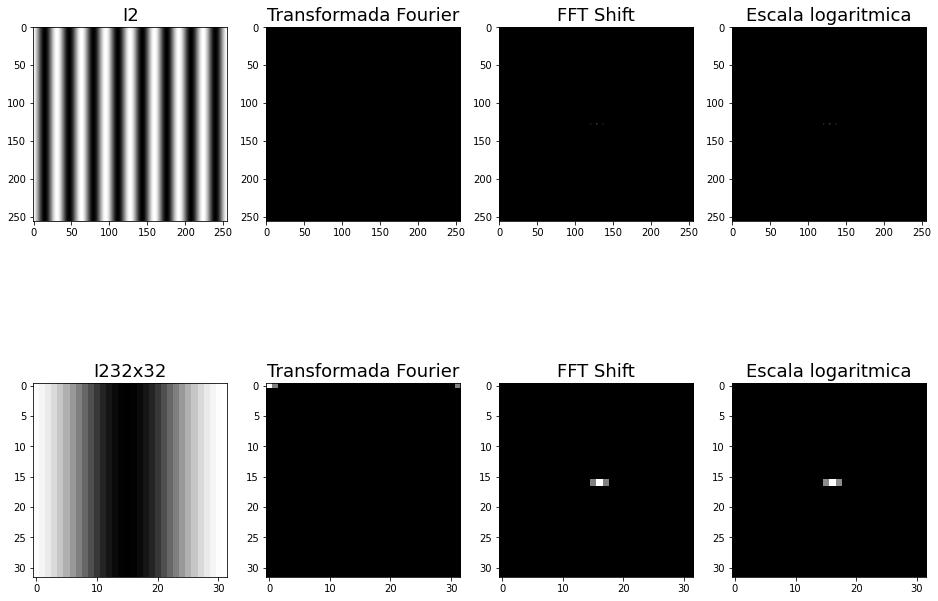

In [219]:
i2 = graficar('I2.png')

In [220]:
y2,x2,z2 = ptos(256,i2)

In [221]:
# Grafico 3D (x,y--> ubicacion de los pixeles, z-> valor del pixel en la T.F)
fig = go.Figure(data=[go.Mesh3d(x=x2, y=y2, z=z2, color='blue', opacity=0.50)])
fig.update_layout(scene = dict(
                    xaxis_title='X',
                    yaxis_title='Y ',
                    zaxis_title='AMPLITUD')
                 )
fig.show()

In [222]:
# Qué valores tienen estos impulsos del gráfico?
print(np.unique(z2))
num_impulsos = 3
reverse_arr =np.sort(z2)[::-1]
reverse_arr = reverse_arr[0:num_impulsos]
print(f"Los {num_impulsos} impulsos más importantes tienen como valor: {reverse_arr}")

[0.         0.0000072  0.00001738 0.00002661 0.00002661 0.00002661
 0.00002661 0.00002661 0.00002661 0.00002661 0.00002661 0.000051
 0.00011636 0.00015601 0.00015729 0.00015753 0.00019371 0.00021555
 0.09698608 0.09698608 0.17607352]
Los 3 impulsos más importantes tienen como valor: [0.17607352 0.09698608 0.09698608]


**Conclusiones**:

1. Para la imagen I2 donde se muestra solo los 32x32 pixeles de la esquina superior izquierda de la Transformada de Fourier, se puede ver que el pixel en la posición (0,0) en el dominio del espacio corresponde al pixel (0,0) en el dominio de la frecuencia , sobre este ultimo se dice que la frecuencia es 0 en las dos direcciones (corresponde a las bajas frecuencias en el dominio de Fourier).

2. Tal como se ve en el gráfico de la escala logarítmica como en el gráfico 3D, existen 3 grandes impulsos en Fourier, lo cual nos indica que la imagen original se puede aproximar como la resultante de la sumatoria de tres funciones ponderadas tipo coseno - seno.

3. La ponderacíon de estas funciones tipo coseno-seno no es más que la altura correspondiente de cada impulso del gráfico 3D.

4. Estos impulsos tienen como característica en común que en plano XYZ tienen un mismo valor en Y y distintos valores en  X, lo cual indica que la imagen original tiene forma de sinusoide horizontal.


### Imagen I3

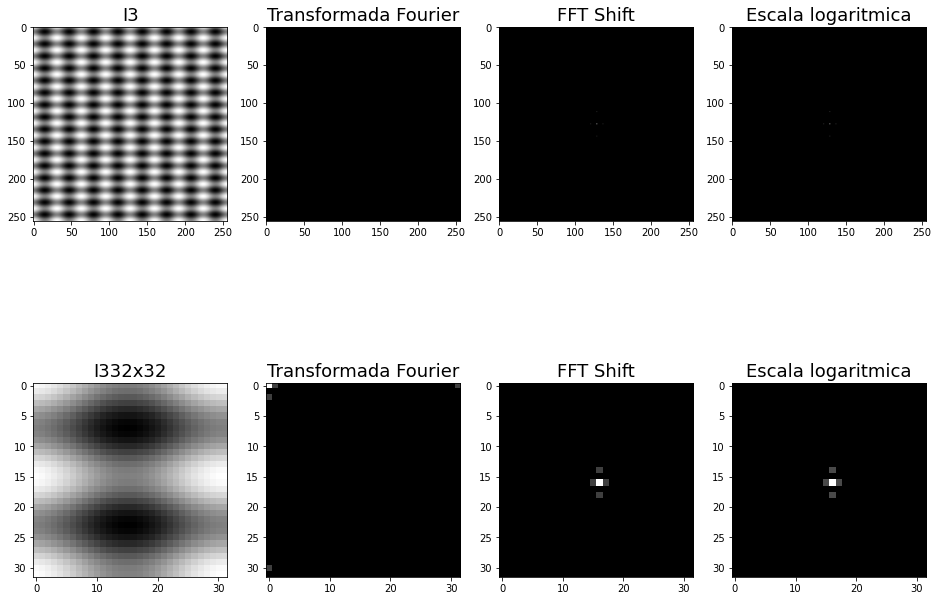

In [223]:
i3 = graficar('I3.png')

In [224]:
y3,x3,z3 = ptos(256,i3)

In [225]:
# Grafico 3D (x,y--> ubicacion de los pixeles, z-> valor del pixel en la T.F)
fig = go.Figure(data=[go.Mesh3d(x=x3, y=y3, z=z3, color='blue', opacity=0.50)])
fig.update_layout(scene = dict(
                    xaxis_title='X',
                    yaxis_title='Y ',
                    zaxis_title='AMPLITUD') # Amplitud
                 )
fig.show()

In [226]:
# Qué valores tienen estos impulsos del gráfico?
print(np.unique(z3))
num_impulsos = 5
reverse_arr =np.sort(z3)[::-1]
reverse_arr = reverse_arr[0:num_impulsos]
print(f"Los {num_impulsos} impulsos más importantes tienen como valor: {reverse_arr}")

[0.         0.00000001 0.00000001 ... 0.0511215  0.05114264 0.17609466]
Los 5 impulsos más importantes tienen como valor: [0.17609466 0.05114264 0.05114264 0.0511215  0.0511215 ]


**Conclusiones**:

1. Para la imagen I3 donde se muestra solo los 32x32 pixeles de la esquina superior izquierda de la Transformada de Fourier, se puede ver que el pixel en la posición (0,0) en el dominio del espacio corresponde al pixel (0,0) en el dominio de la frecuencia , sobre este ultimo se dice que la frecuencia es 0 en las dos direcciones (corresponde a las bajas frecuencias en el dominio de Fourier).

2. Tal como se ve en el gráfico de la escala logarítmica como en el gráfico 3D, existen 5 grandes impulsos en Fourier, lo cual nos indica que la imagen original se puede aproximar como la resultante de la sumatoria de cinco funciones ponderadas tipo coseno - seno.

3. La ponderacíon de estas funciones tipo coseno-seno no es más que la altura correspondiente de cada impulso del gráfico 3D.

4. Estos impulsos difieren tanto en valores de los eje X e Y , ya que la imagen original es un promedio de una sinusoide vertical y una sinusoide horizontal.

5. El número de impulsos significativos encontrados en esta imagen son 5 , ya que en la imagen I1 se encontró 3 impulsos significativos y en la imagen I2 se encontró 3 impulsos significativos, resaltar que el impulso principal (0,0) se encuentra en la misma posición para estas dos imágenes.


# 3.Problema 03

## 3.1.Enunciado

Las siguientes imagenes son de 256x256 pixeles. P.png es una imagen en la que se ven tres peatones, sin embargo, ha sido alterada con un ruido que tiene la forma sinuosodial de I2.png. El resultado es W.png que ha sido calculado como el promedio de P.png e I2.png. Grafique la Transformada de Fourier en 2D de cada una de las imagenes, pero en esta ocasion emplee una escala logaritmica, es decir calcule Z = log(abs(F)+1), donde F es la Transformada de Fourier y grafique k*Z donde k = 255/max(Z). 

Que diferencia existe entre la Transformada de Fourier de P y la de W? (analice los 32x32 pixeles de la esquina superior izquierda de la Transformada de Fourier). 

Seria posible eliminar el ruido sinuosidal presente en W para recuperar P? En este caso suponga que solo cuenta con la imagen W (y su transformada de Fourier). Explique como poodria hacerse. En este problema no se pretende que realice esta ultima operacion, solo que explique como se podria hacer. Las explicaciones incluyalas como comentarios en el codigo.

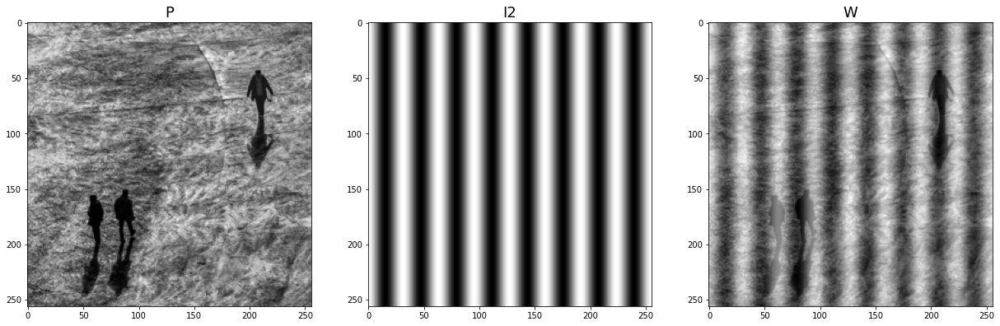

In [98]:
P = mpimg.imread('P.png')
I2 = mpimg.imread('I2.png')
W = mpimg.imread('W.png')

plt.figure(1,figsize=(21,9))

plt.subplot(1, 3, 1)
plt.title('P',fontsize = 18)
plt.imshow(P,cmap='gray')


plt.subplot(1, 3, 2)
plt.title('I2',fontsize = 18)
plt.imshow(I2,cmap = 'gray')


plt.subplot(1, 3, 3)
plt.title('W',fontsize = 18)
plt.imshow(W,cmap = 'gray')


plt.show()

## 3.2.Solución

In [156]:
def fft(path):
    imagen = mpimg.imread(path)
    name = path[0:2]
    name_r = str(name) + str(32) + str('x')+ str(32)
    recorte = imagen[0:32,0:32]
    
    H,W = np.shape(imagen)   # Dimensiones de la imagen I1
    H_r,W_r = np.shape(recorte)

    # Transformada de Fourier
    F = np.fft.fft2(imagen)
    Fr = np.fft.fft2(recorte)
    
    # Módulo de TF
    mod_F = np.abs(F) 
    mod_Fr = np.abs(Fr)


    # FFT Shift--> Desplaza cuadrantes
    FFT_shift = np.fft.fftshift(F)
    FFT_shift_r = np.fft.fftshift(Fr)
    
    # Modulo de FFTShift
    mod_FFTshift = np.abs(FFT_shift)
    mod_FFTshift_r = np.abs(FFT_shift_r)


    # Escala logaritmica
    esc_log = np.log10(mod_FFTshift + 1) # Modulo
    k_1 = 255/np.max(esc_log)
    z_1 = k_1*esc_log
    
    
    esc_log_r = np.log10(mod_FFTshift_r + 1)
    k_2 = 255/np.max(esc_log_r)
    z_2 = k_2*esc_log_r
    

    # Graficamos

    plt.figure(1,figsize=(16,8))

    plt.subplot(2, 5, 1)
    plt.title(name,fontsize = 18)
    plt.imshow(imagen,cmap='gray')

    plt.subplot(2, 5, 2)
    plt.title('Transformada Fourier',fontsize = 18)
    plt.imshow(mod_F,cmap = 'gray')

    plt.subplot(2, 5, 3)
    plt.title('FFT Shift',fontsize = 18)
    plt.imshow(mod_FFTshift,cmap = 'gray')

    plt.subplot(2, 5, 4)
    plt.title('Escala logaritmica',fontsize = 18)
    plt.imshow(esc_log,cmap = 'gray')
    
    plt.subplot(2, 5, 5)
    plt.title('k*z',fontsize = 18)
    plt.imshow(z_1,cmap = 'gray')
    
    plt.subplot(2, 5, 6)
    plt.title(name_r,fontsize = 18)
    plt.imshow(recorte,cmap='gray')
    
    plt.subplot(2, 5, 7)
    plt.title('Transformada Fourier',fontsize = 18)
    plt.imshow(mod_Fr,cmap = 'gray')
    
    plt.subplot(2, 5, 8)
    plt.title('FFT Shift',fontsize = 18)
    plt.imshow(mod_FFTshift_r,cmap = 'gray')
    
    plt.subplot(2, 5, 9)
    plt.title('Escala logaritmica',fontsize = 18)
    plt.imshow(esc_log_r,cmap = 'gray')
    
    plt.subplot(2, 5, 10)
    plt.title('k*z',fontsize = 18)
    plt.imshow(z_2,cmap = 'gray')
    
    return z_2

In [185]:
def ptos(H_r,arrg):
    pts_p = [] # Lista de puntos con las coordenadas del pixel en la imagen y su valor en Fourier
    for i in range(0,H_r):
        for j in range(0,H_r):
            pts_p.append([j,i,arrg[j][i]])
    pts_p = np.array(pts_p)
    yp, xp, zp = pts_p.T
    return yp,xp,zp

### Imagen P

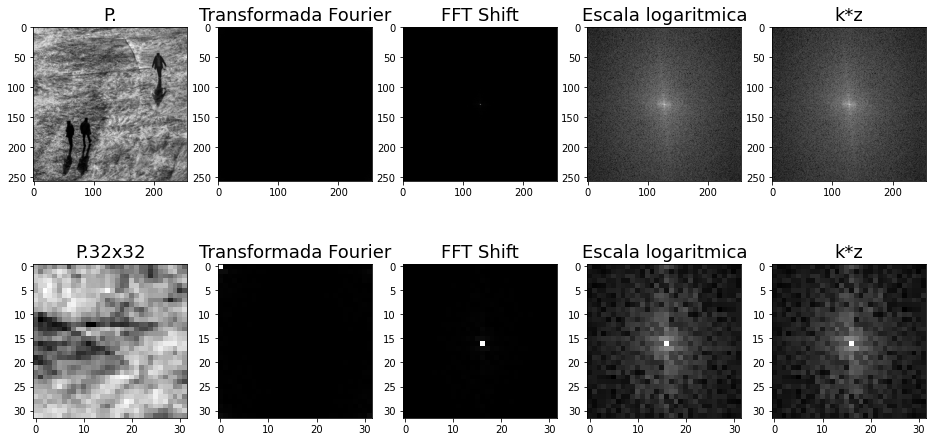

In [164]:
z_p = fft('P.png')

In [186]:
yp,xp,zp = ptos(32,z_p)

In [187]:
# Grafico 3D (x,y--> ubicacion de los pixeles, z-> Valor del pixel en la T.F)
fig = go.Figure(data=[go.Mesh3d(x = xp, y = yp, z = zp, color = 'blue', opacity = 0.50)])
fig.update_layout(scene = dict(
                    xaxis_title='X',
                    yaxis_title='Y',
                    zaxis_title='AMPLITUD')
                 )
fig.show()

### Imagen I2

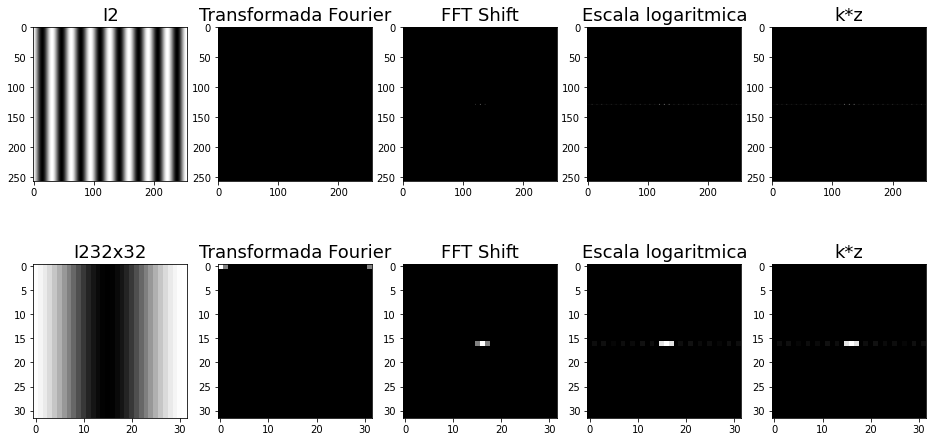

In [178]:
z_2 = fft('I2.png')

In [190]:
yi,xi,zi = ptos(32,z_2)

In [191]:
# Grafico 3D (x,y--> ubicacion de los pixeles, z-> Valor del pixel en la T.F)
fig = go.Figure(data=[go.Mesh3d(x = xi, y = yi, z = zi, color = 'blue', opacity = 0.50)])
fig.update_layout(scene = dict(
                    xaxis_title='X',
                    yaxis_title='Y',
                    zaxis_title='AMPLITUD')
                 )
fig.show()

### Imagen W

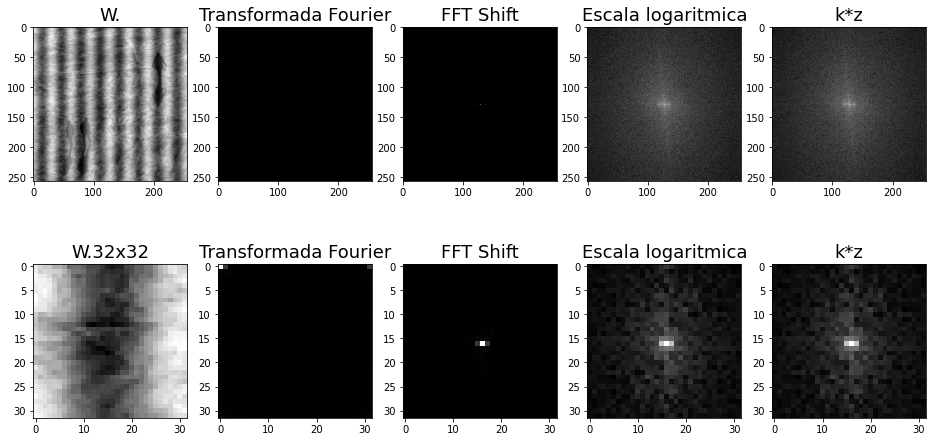

In [192]:
z_w = fft('W.png')

In [193]:
yw,xw,zw = ptos(32,z_w)

In [194]:
# Grafico 3D (x,y--> ubicacion de los pixeles, z-> Valor del pixel en la T.F)
fig = go.Figure(data=[go.Mesh3d(x = xw, y = yw, z = zw, color = 'blue', opacity = 0.50)])
fig.update_layout(scene = dict(
                    xaxis_title='X',
                    yaxis_title='Y',
                    zaxis_title='AMPLITUD')
                 )
fig.show()

### Preguntas

1.¿Que diferencia existe entre la Transformada de Fourier de P y la de W?

In [196]:
# Graficamos las TF de P y W
fig2 = go.Figure(data=[go.Mesh3d(x=xp, y=yp, z=zp, color='blue', opacity=0.50)])
fig2.add_trace(go.Mesh3d(x=xw, y=yw, z=zw, color='red', opacity=0.50))
fig2.show()

Cómo se ve en el gráfico 3D hay muchas zonas dentro del plano XY donde la curva roja y la curva azul están superpuestas; lo cual indica que ambas imágenes comparten estas frecuencias en el espectro de Fourier; mientras que existen otras zonas del plano en las cuales solo se presentan impulsos correspondientes a la transformada de Fourier de la imagen P(zonas azules); lo cual representa que las frecuencias de esta zona en el espectro de Fourier son exclusivas para la imagen P.

2.¿Sería posible eliminar el ruido sinuosidal presente en W para recuperar P?

In [199]:
fig3 = go.Figure(data=[go.Mesh3d(x=xi, y=yi, z=zi, color='cyan', opacity=0.50)])
fig3.add_trace(go.Mesh3d(x=xw, y=yw, z=zw, color='red', opacity=0.50))
fig3.show()

1. No es posible eliminar el ruido sinusoidal del todo ya que como se ve en el gráfico existen algunas frecuencias del ruido como la frecuencia de amplitud máxima en el espectro de Fourier que tiene la misma frecuencia que la frecuencia de amplitud máxima de la imagen W.

2. Para recuperar la mayor cantidad de información de la imagen P lo que se debe hacer es definir un umbral en el eje de las amplitud de frecuencias a modo de quedarnos solo con las frecuencias significativas del espectro de Fourier de P, eliminando así las bajas frecuencias que vienen de la imagen I2 y que significan ruido.